# Tankstellen in Hamburg

Importieren aller libraries

***

In [ ]:
# import all libraries
import pandas as pd
import numpy as  np
import os

from Data_cleaning import concatenate_station_info_zipcode
from Data_cleaning import concatenate_station_info_city

from datetime import datetime

import plotly as plt
import plotly_express as px
import plotly.graph_objects as go

***

# Making a dataframe for EDA from historical data

We have the following data:
1) CSV files of gas stations for every day -> we only need the most recent one
* Read in the CSV as a data frame
* We only need the stations from a certain town or region


2)  CSV files for gas station prices for every day
* Make a loop: 
    For csv file in folder:
        Read the file
        Take the data with the uuid (from stations file)
        concatenate/merge? to stations_df (on = 'uuid' how= 'left join')


In [3]:
# Dataframe from Stations CSV file 
df_s = pd.read_csv('data/2025-05-25-stations.csv')
df_s.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17559 entries, 0 to 17558
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   uuid               17559 non-null  object 
 1   name               17558 non-null  object 
 2   brand              16886 non-null  object 
 3   street             17557 non-null  object 
 4   house_number       16536 non-null  object 
 5   post_code          17558 non-null  object 
 6   city               17556 non-null  object 
 7   latitude           17559 non-null  float64
 8   longitude          17559 non-null  float64
 9   first_active       17559 non-null  object 
 10  openingtimes_json  17559 non-null  object 
dtypes: float64(2), object(9)
memory usage: 1.5+ MB


In [4]:
# We isolate the data just for city

city = "Hamburg"

hamburg_df_s = df_s[df_s['city'] == city]
hamburg_df_s.info()

<class 'pandas.core.frame.DataFrame'>
Index: 182 entries, 28 to 17063
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   uuid               182 non-null    object 
 1   name               182 non-null    object 
 2   brand              181 non-null    object 
 3   street             182 non-null    object 
 4   house_number       169 non-null    object 
 5   post_code          182 non-null    object 
 6   city               182 non-null    object 
 7   latitude           182 non-null    float64
 8   longitude          182 non-null    float64
 9   first_active       182 non-null    object 
 10  openingtimes_json  182 non-null    object 
dtypes: float64(2), object(9)
memory usage: 17.1+ KB


There are 182 gas stations on the 25-05-2025 in the city of Hamburg

## concatenating stations data and price data

In [29]:
# rename the uuid in station_uuid
hamburg_df_s.rename(columns={'uuid': 'station_uuid'}, inplace=True)

/var/folders/tk/dk9lmvjd3q33k1whr558my540000gn/T/ipykernel_64580/298261567.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hamburg_df_s.rename(columns={'uuid': 'station_uuid'}, inplace=True)


In [ ]:
# concatenate the prices only for hamburg
# Your list of Hamburg UUIDs
hamburg_uuids = set(hamburg_df_s['station_uuid'])

# Folder where your daily price CSVs are
folder_path = 'data/2024-prices'

# Collect matching rows from each file
df_list = []
for file in sorted(os.listdir(folder_path)):
    if file.endswith('.csv'):
        df = pd.read_csv(os.path.join(folder_path, file))
        filtered = df[df['station_uuid'].isin(hamburg_uuids)]
        df_list.append(filtered)

# Combine all into one DataFrame
hamburg_prices = pd.concat(df_list, ignore_index=True)

# Join with station info
final_df = pd.merge(hamburg_prices, hamburg_df_s, on='station_uuid', how='left')



Let's create a function for this: 

Is in Data_cleaning.py 
function name is concatenate_station_info



In [15]:
stations = 'data/2025-05-25-stations.csv'
prices = 'data/2023-25-prices'
city = 'Hamburg'

hamburg = concatenate_station_info_city(stations, prices, city)

In [16]:
hamburg.to_parquet('data/hamburg_2023-25.parquet')

***
# Create data for Fürstenwalde and Wertheim

### Fürstenwalde

In [ ]:
stations = 'data/2025-05-25-stations.csv'
prices = 'data/2023-25-prices'
zipcode = '15517'

fuerstenwalde = concatenate_station_info_zipcode(stations, prices, zipcode)

In [ ]:
fuerstenwalde.head()

,station_uuid,name,brand,street,house_number,post_code,city,latitude,longitude,first_active,openingtimes_json,date,diesel,e5,e10,dieselchange,e5change,e10change
0,f97bcef8-619c-4ac4-bf9d-35995dea884e,Aral Tankstelle,ARAL,Triftstraße,36,15517,Fürstenwalde,52.378353,14.073492,2014-03-18 16:45:31+01,{},2023-01-01 06:31:07+01,1.999,1.879,1.819,1.0,0.0,0.0
1,f97bcef8-619c-4ac4-bf9d-35995dea884e,Aral Tankstelle,ARAL,Triftstraße,36,15517,Fürstenwalde,52.378353,14.073492,2014-03-18 16:45:31+01,{},2023-01-01 08:01:08+01,1.859,1.849,1.789,1.0,1.0,1.0
2,f97bcef8-619c-4ac4-bf9d-35995dea884e,Aral Tankstelle,ARAL,Triftstraße,36,15517,Fürstenwalde,52.378353,14.073492,2014-03-18 16:45:31+01,{},2023-01-01 08:05:08+01,1.839,1.829,1.769,1.0,1.0,1.0
3,f97bcef8-619c-4ac4-bf9d-35995dea884e,Aral Tankstelle,ARAL,Triftstraße,36,15517,Fürstenwalde,52.378353,14.073492,2014-03-18 16:45:31+01,{},2023-01-01 08:40:13+01,1.839,1.819,1.759,0.0,1.0,1.0
4,f97bcef8-619c-4ac4-bf9d-35995dea884e,Aral Tankstelle,ARAL,Triftstraße,36,15517,Fürstenwalde,52.378353,14.073492,2014-03-18 16:45:31+01,{},2023-01-01 09:48:09+01,1.899,1.879,1.819,1.0,1.0,1.0


In [ ]:
fuerstenwalde = pd.read_parquet('data/fuerstenwalde_2023-25.parquet')

### Wertheim

In [ ]:
stations = 'data/2025-05-25-stations.csv'
prices = 'data/2023-25-prices'
zipcode = '97877'

wertheim = concatenate_station_info_zipcode(stations, prices, zipcode)

In [ ]:
wertheim = pd.read_parquet('data/wertheim_2023-25.parquet')

***

# Start from here with loading the data for Hamburg

In [17]:
hamburg = pd.read_parquet('data/hamburg_2023-25.parquet')

In [ ]:
#there are 11 missing values in the date column
hamburg['date'].isna().sum()

11

In [ ]:
# these are the data with missing values, there is no price data, so we can drop these rows
hhna = hamburg[hamburg['date'].isna() == True]

In [ ]:
# we drop the missing values
hamburg = hamburg[~hamburg['date'].isna() == True]

In [ ]:
# we convert the times to datetime and remove the time zone
hamburg["datetime"] = hamburg["date"].apply(lambda x: datetime.strptime(x.split("+")[0], "%Y-%m-%d %H:%M:%S"))

In [ ]:
# we select a random station
station_uuid = 'ff991e83-1373-401c-a7f9-2aa10a76ffc5'  # replace with your actual uuid
one_station_df = hamburg[hamburg["station_uuid"] == station_uuid]

In [ ]:
# we plot the price during time
fig = px.line(one_station_df, x="datetime", y="e5", title="Fuel Price Over Time")
fig.update_layout(
    title_font_size=20,
    xaxis_title="Date",
    yaxis_title="Price (€/L)",
    width=1800,
    height=1000,
    margin=dict(l=40, r=40, t=60, b=40),
    template="plotly_white"
)
fig.show()

***
# We compare the prices of all stations in time intervals

In [55]:
hamburg_date = hamburg.copy()

In [56]:
hamburg_date_cleaned = (
    hamburg_date.sort_values('datetime')  # ensure sorting so last() works as expected
      .groupby(['station_uuid', 'datetime'], as_index=False)
      .last()  # or .mean() if multiple entries should be averaged
)

In [57]:
# the timestamp is set as index
hamburg_date_cleaned = hamburg_date_cleaned.set_index('datetime')

In [ ]:
# the data is grouped by station uuid and the process is resampled for 5 minutes and filled
hh_resampled = (
    hamburg_date_cleaned.groupby('station_uuid')['e5']
    .resample('5min')  # or '1h'
    .ffill()
    .reset_index()
)

In [59]:
# average prices
average_prices = (
    hh_resampled
    .groupby('datetime')['e5']
    .mean()
    .reset_index()
)


In [66]:
# drop the first missing value
average_prices = average_prices[average_prices['e5'].isna() == False]

In [60]:
# we plot the price during time
averagehh = px.line(average_prices, x="datetime", y="e5", title="Average E5 Price in Hamburg Over Time")
averagehh.update_layout(
    title_font_size=20,
    xaxis_title="Time",
    yaxis_title="Average price (€/L)",
    width=1500,
    height=800,
    margin=dict(l=40, r=40, t=60, b=40),
    template="plotly_white"
)
averagehh.show()

In [ ]:
# the time of day is converted to hour and minute and set as a new column called time of day
hh_resampled['time_of_day'] = hh_resampled['datetime'].dt.strftime('%H:%M')

In [ ]:
# we make a daily profile by grouping by time of day (5 minutes steps) and give the time mean for this
daily_profile = (
    hh_resampled.groupby('time_of_day')['e5']
    .mean()
    .reset_index()
)

In [ ]:
# plot the day profile
dailyhh = px.line(daily_profile, x='time_of_day', y="e5", title="Average E5 Price in Hamburg during the day")
dailyhh.update_layout(
    title_font_size=20,
    xaxis_title="Time of Day",
    yaxis_title="Average price (€/L)",
    width=1500,
    height=800,
    margin=dict(l=40, r=40, t=60, b=40),
    template="plotly_white"
)
dailyhh.show()

In [64]:
import statsmodels.formula.api as smf
from statsmodels.tsa.seasonal import seasonal_decompose

In [79]:
average_prices.set_index('datetime').asfreq('5min')

,e5
datetime,
2023-01-01 00:05:00,2.239000
2023-01-01 00:10:00,2.239000
2023-01-01 00:15:00,2.239000
2023-01-01 00:20:00,2.239000
2023-01-01 00:25:00,2.239000
...,...
2025-05-25 23:00:00,1.688057
2025-05-25 23:05:00,1.673865
2025-05-25 23:10:00,1.675389


In [86]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
sns.set_style(
    style='darkgrid', 
    rc={'axes.facecolor': 'white', 'grid.color': '.8'}
)
NF_ORANGE = "#eb350c"
NF_BLUE = "#0C66CD"
cmaps_hex = ['#193251','#FF5A36','#696969', '#7589A2','#FF5A36', '#DB6668']
sns.set_palette(palette=cmaps_hex)
sns_c = sns.color_palette(palette=cmaps_hex)
%matplotlib inline
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

plt.rcParams['figure.figsize'] = [12, 6]
plt.rcParams['figure.dpi'] = 100

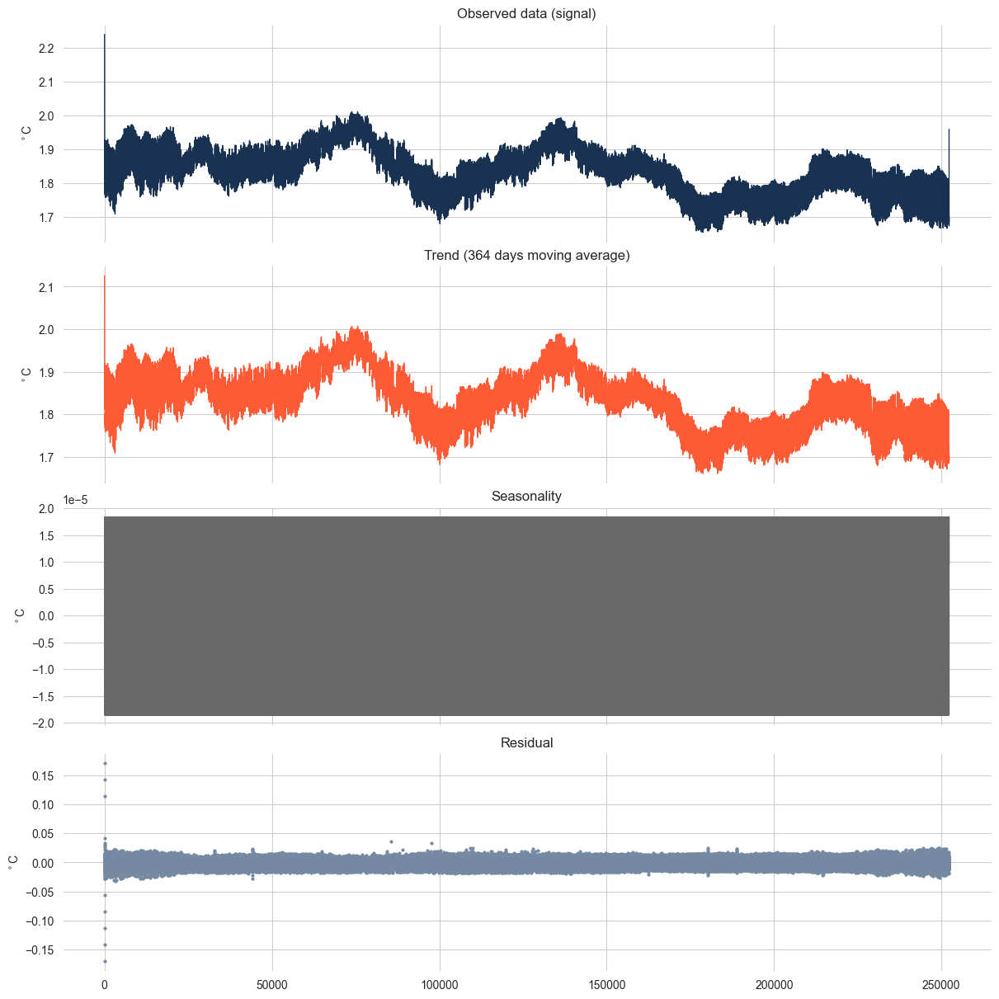

In [101]:
seas_decomp_average = seasonal_decompose(
    x=average_prices['e5'], 
    model='additive', 
    two_sided=True,
    period=13)

fig, ax = plt.subplots(4, 1, figsize=(12, 12), constrained_layout=True)
#Plot Signal
ax[0].set(title='Observed data (signal)', 
          ylabel=r'$^\circ$C')
seas_decomp_average.observed.plot(color=sns_c[0], 
                              linewidth=1,
                              sharex=True,
                              ax=ax[0])
#Plot Trend
ax[1].set(title='Trend (364 days moving average)', 
          ylabel=r'$^\circ$C')
seas_decomp_average.trend.plot(color=sns_c[1], 
                              linewidth=1,
                              sharex=True,
                              ax=ax[1])
#Plot Seasonality
ax[2].set(title='Seasonality', 
          ylabel=r'$^\circ$C')
seas_decomp_average.seasonal.plot(
                                color=sns_c[2], 
                                linewidth=1,
                                sharex=True,
                                ax=ax[2])
#Plot residual
ax[3].set(title='Residual', 
          ylabel=r'$^\circ$C');
ax[3].scatter(
    x=seas_decomp_average.resid.index,
    y=seas_decomp_average.resid,
    color=sns_c[3],
    s=4)


In [ ]:
from statsmodels.tsa.seasonal import STL

# First properly set the datetime index
average_prices_ts = average_prices.set_index('datetime')['e5']

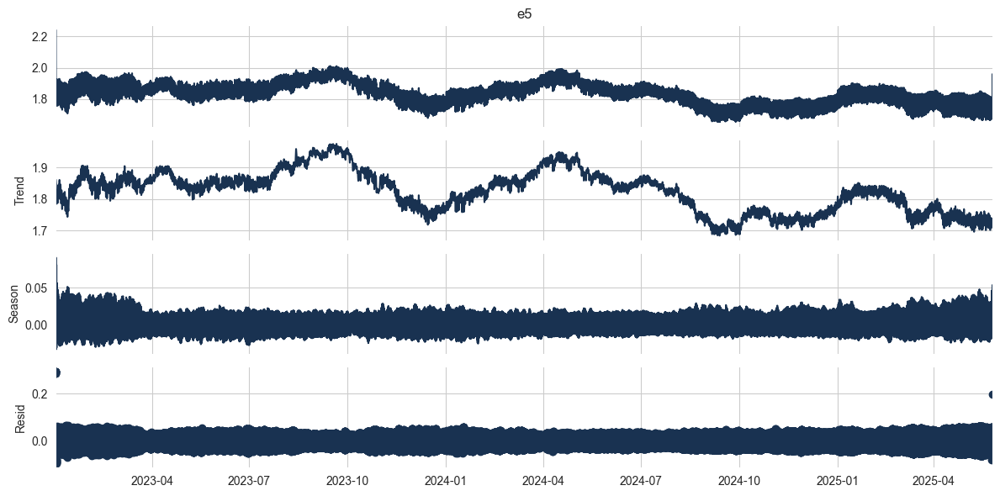

In [121]:
# Period = number of samples per daily cycle = 288 for 5-min steps
stl = STL(average_prices_ts, period=144)
result = stl.fit()

# Plot
result.plot()
plt.tight_layout()

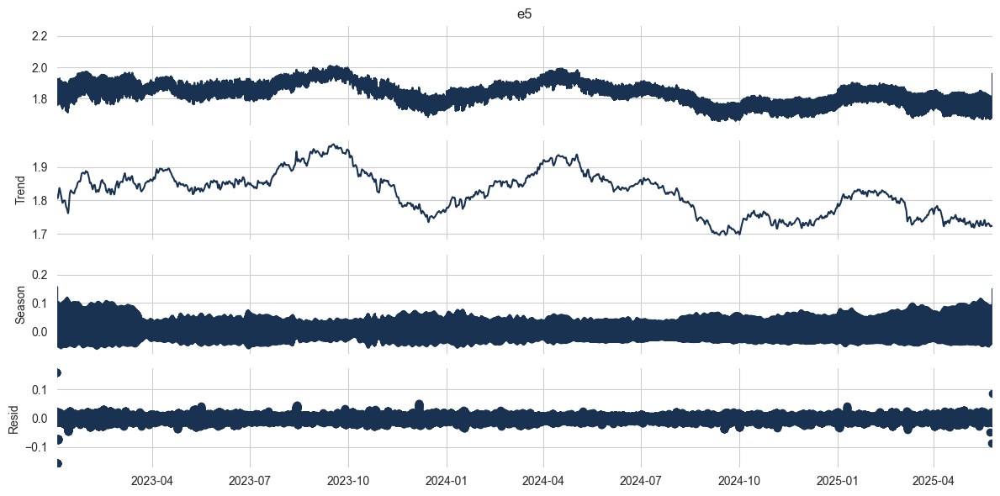

In [ ]:

# Period = number of samples per daily cycle = 288 for 5-min steps
stl = STL(average_prices_ts, period=288)
result = stl.fit()

# Plot
result.plot()
plt.tight_layout()

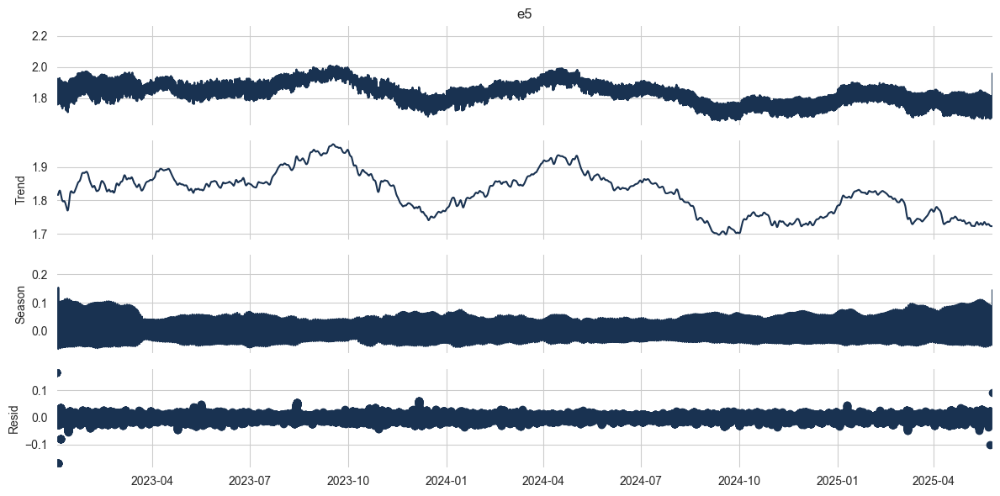

In [109]:

# Period = number of samples per daily cycle = 288 for 5-min steps
stl = STL(average_prices_ts, period=576)
result = stl.fit()

# Plot
result.plot()
plt.tight_layout()

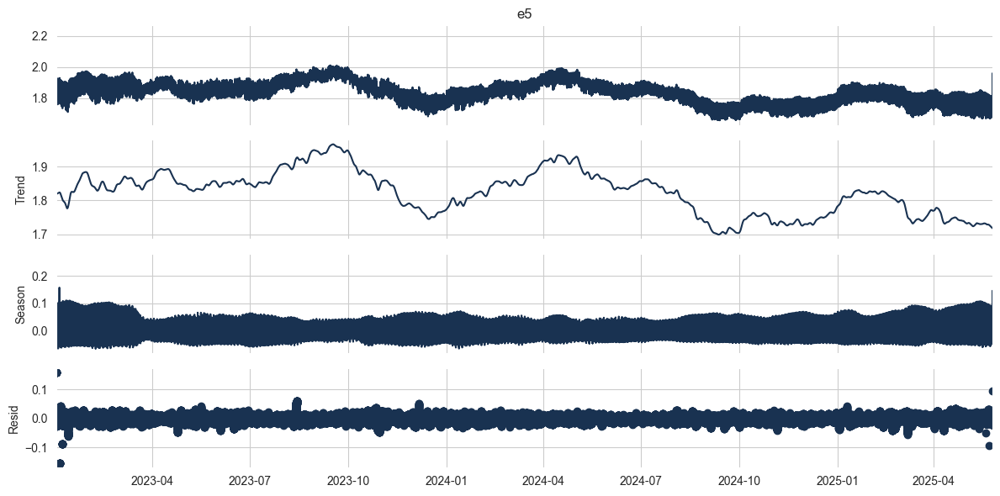

In [111]:

# Period = number of samples per daily cycle = 288 for 5-min steps
stl = STL(average_prices_ts, period=864)
result = stl.fit()

# Plot
result.plot()
plt.tight_layout()

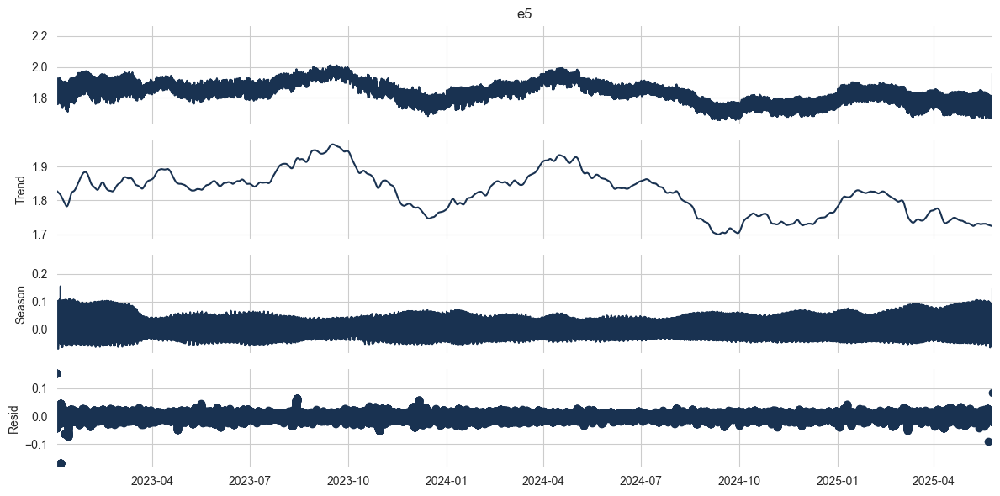

In [112]:

# Period = number of samples per daily cycle = 288 for 5-min steps
stl = STL(average_prices_ts, period=1152)
result = stl.fit()

# Plot
result.plot()
plt.tight_layout()

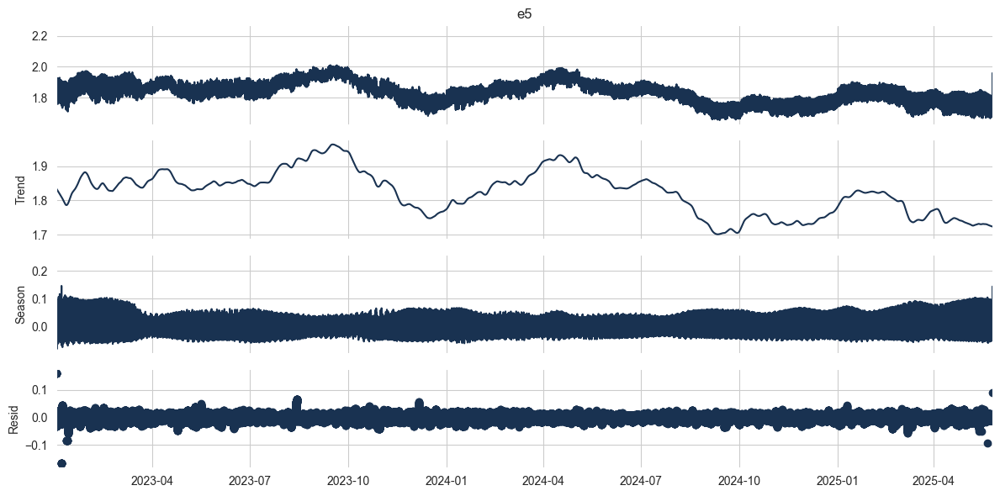

In [113]:
# Period = number of samples per daily cycle = 288 for 5-min steps
stl = STL(average_prices_ts, period=1440)
result = stl.fit()

# Plot
result.plot()
plt.tight_layout()

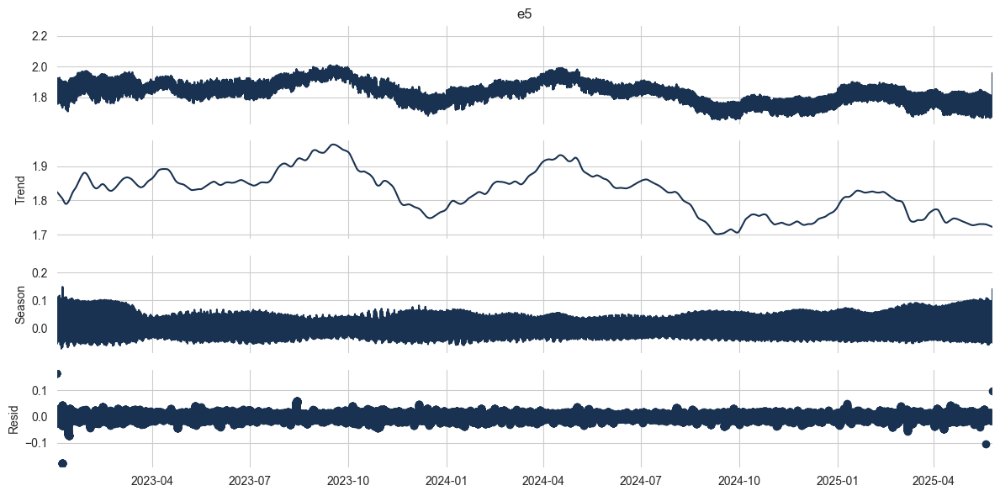

In [114]:
# Period = number of samples per daily cycle = 288 for 5-min steps
stl = STL(average_prices_ts, period=1728)
result = stl.fit()

# Plot
result.plot()
plt.tight_layout()

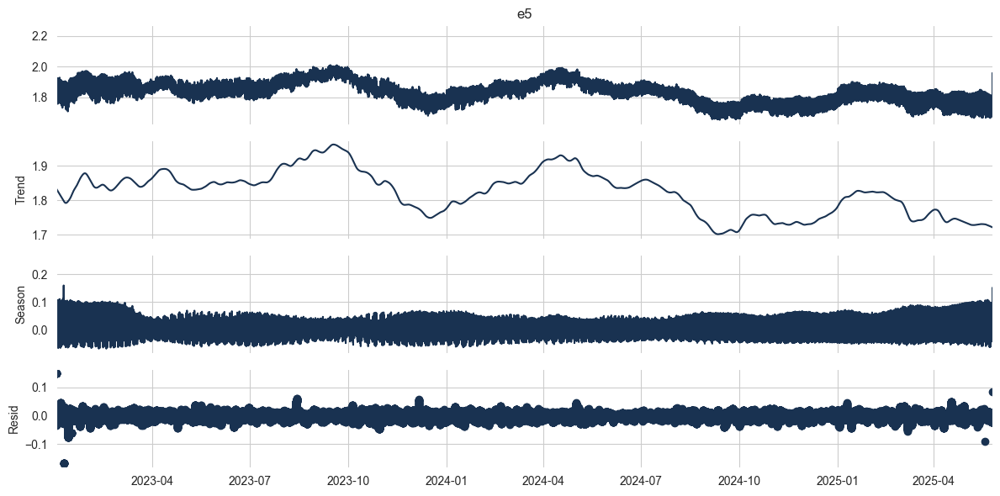

In [115]:
# Period = number of samples per daily cycle = 288 for 5-min steps
stl = STL(average_prices_ts, period=2016)
result = stl.fit()

# Plot
result.plot()
plt.tight_layout()

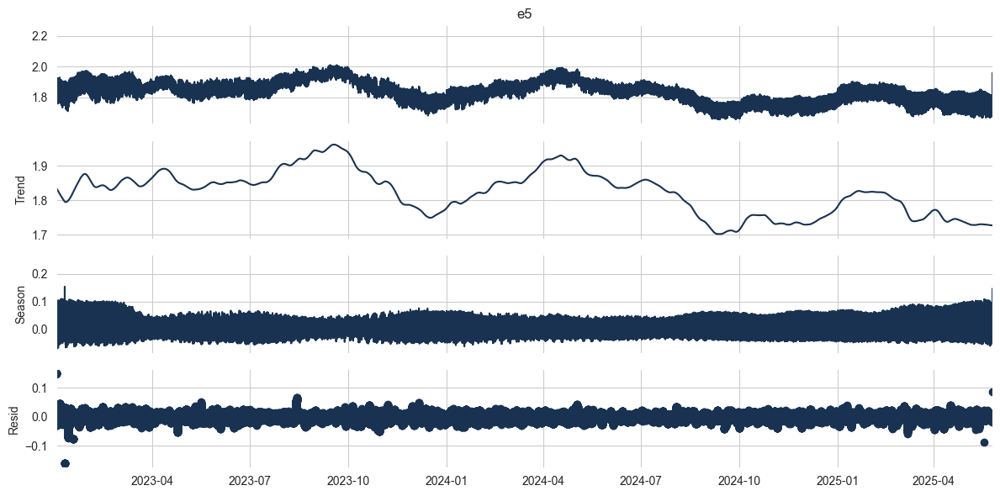

In [116]:
# Period = number of samples per daily cycle = 288 for 5-min steps
stl = STL(average_prices_ts, period=2304)
result = stl.fit()

# Plot
result.plot()
plt.tight_layout()

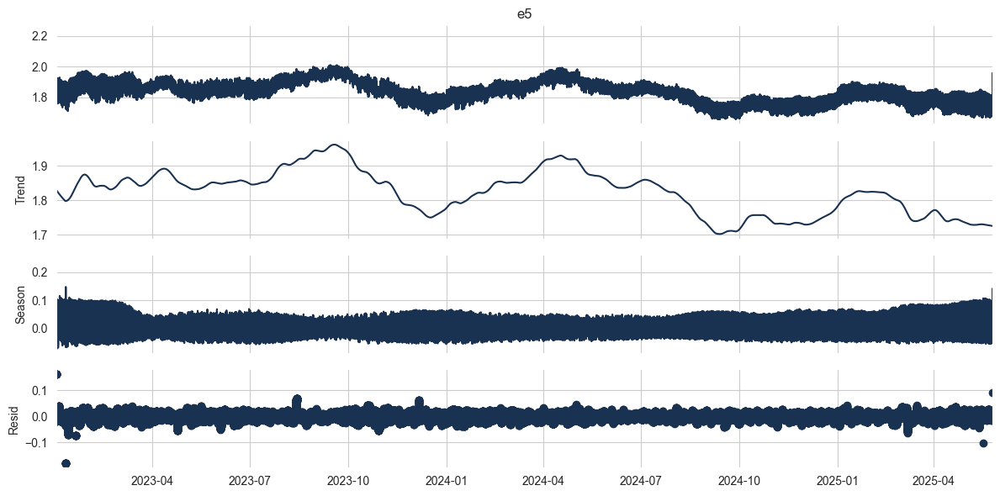

In [117]:
# Period = number of samples per daily cycle = 288 for 5-min steps
stl = STL(average_prices_ts, period=2592)
result = stl.fit()

# Plot
result.plot()
plt.tight_layout()

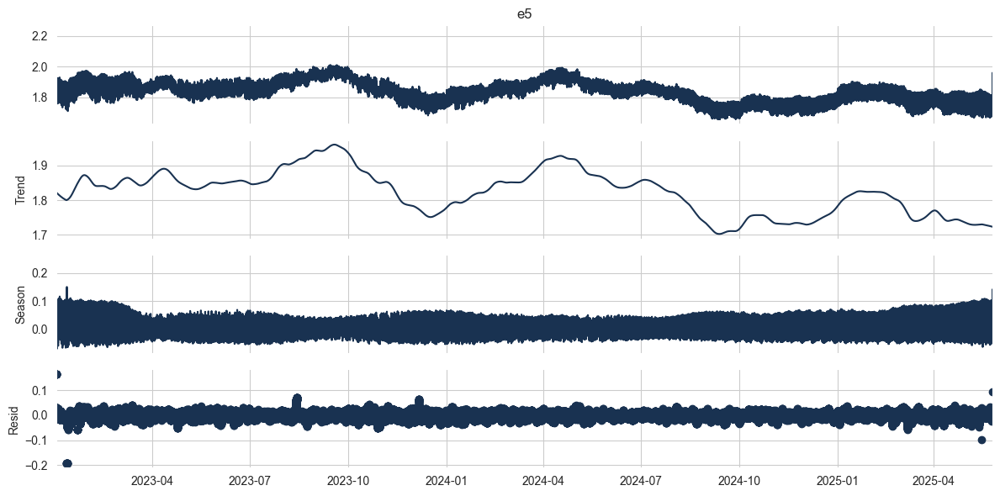

In [118]:
# Period = number of samples per daily cycle = 288 for 5-min steps
stl = STL(average_prices_ts, period=2880)
result = stl.fit()

# Plot
result.plot()
plt.tight_layout()

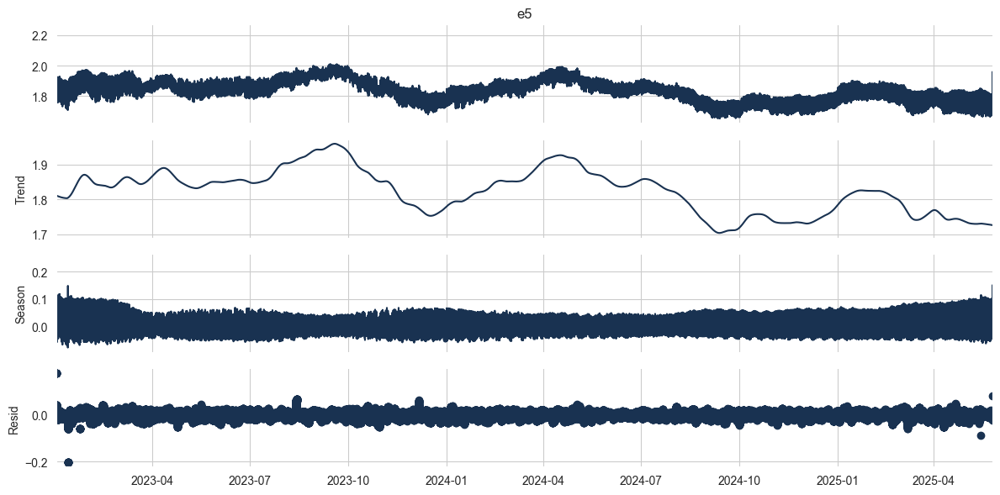

In [119]:
# Period = number of samples per daily cycle = 288 for 5-min steps
stl = STL(average_prices_ts, period=3168)
result = stl.fit()

# Plot
result.plot()
plt.tight_layout()

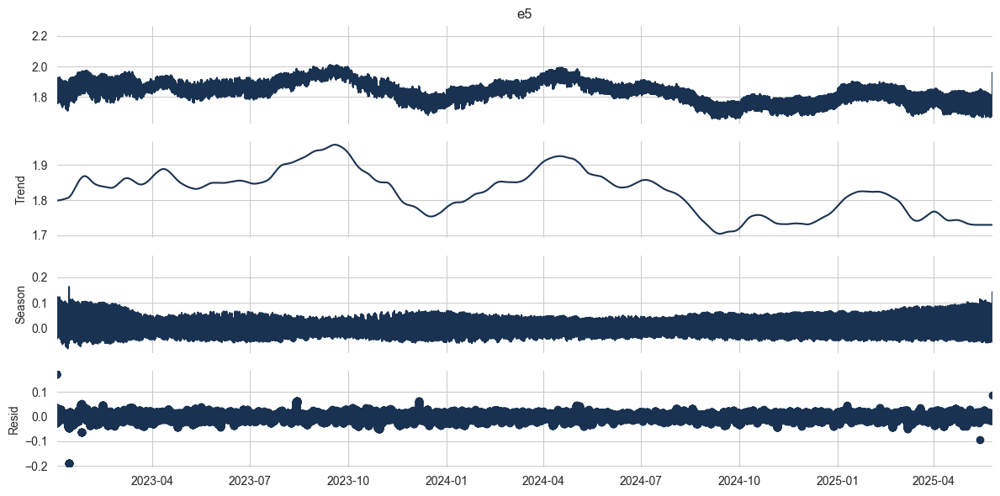

In [120]:
# Period = number of samples per daily cycle = 288 for 5-min steps
stl = STL(average_prices_ts, period=3456)
result = stl.fit()

# Plot
result.plot()
plt.tight_layout()